<a href="https://colab.research.google.com/github/lizathulya/Data_Analytics_/blob/main/Correlation_in_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None# Now we need to read in the data
df = pd.read_csv(r'/content/movies.csv')

In [ ]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,NaN,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,NaN,NaN,120.0


In [ ]:
df = df.dropna()

In [ ]:
# We need to see if we have any missing data
# Let's loop through the data and see if there is anything missing

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.0%
genre - 0.0%
year - 0.0%
released - 0.0%
score - 0.0%
votes - 0.0%
director - 0.0%
writer - 0.0%
star - 0.0%
country - 0.0%
budget - 0.0%
gross - 0.0%
company - 0.0%
runtime - 0.0%


In [ ]:
# Data Types for our columns

print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [ ]:
df['budget']=df['budget'].astype('int64')
df['gross']=df['gross'].astype('int64')

In [ ]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0


In [ ]:
#create correct year version
df['year_correct']=df['released'].astype('str').str[-20: -16]
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0,2020
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0,2020
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0,2020
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0,2020


In [ ]:
pd.set_option('display.max_rows',None )

In [ ]:
df.sort_values(by=['gross'],inplace=False,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019


In [ ]:
# dropping any duplicates
df['company'].drop_duplicates().sort_values(ascending=False)

,company
7129,thefyzz
5664,micro_scope
4007,i5 Films
6793,i am OTHER
6420,erbp
3776,double A Films
3330,Zucker Brothers Productions
146,Zoetrope Studios
2213,Zeta Entertainment
3698,Zentropa Entertainments


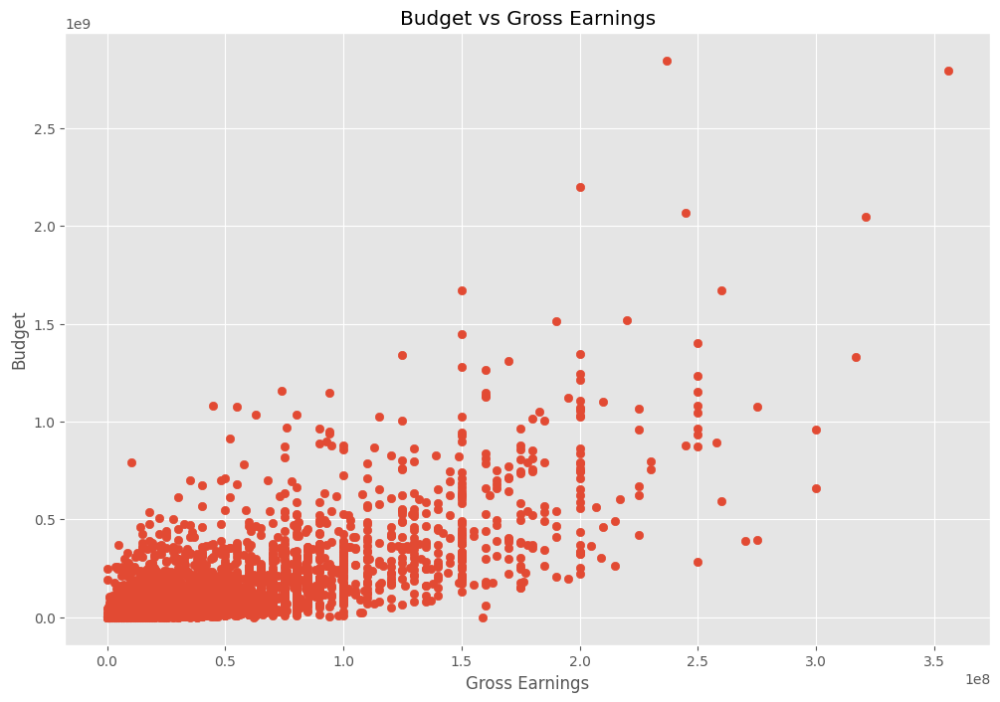

In [ ]:
#  scatter plot Budget vs gross
plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget' )
plt.show()

In [ ]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


<Axes: xlabel='budget', ylabel='gross'>

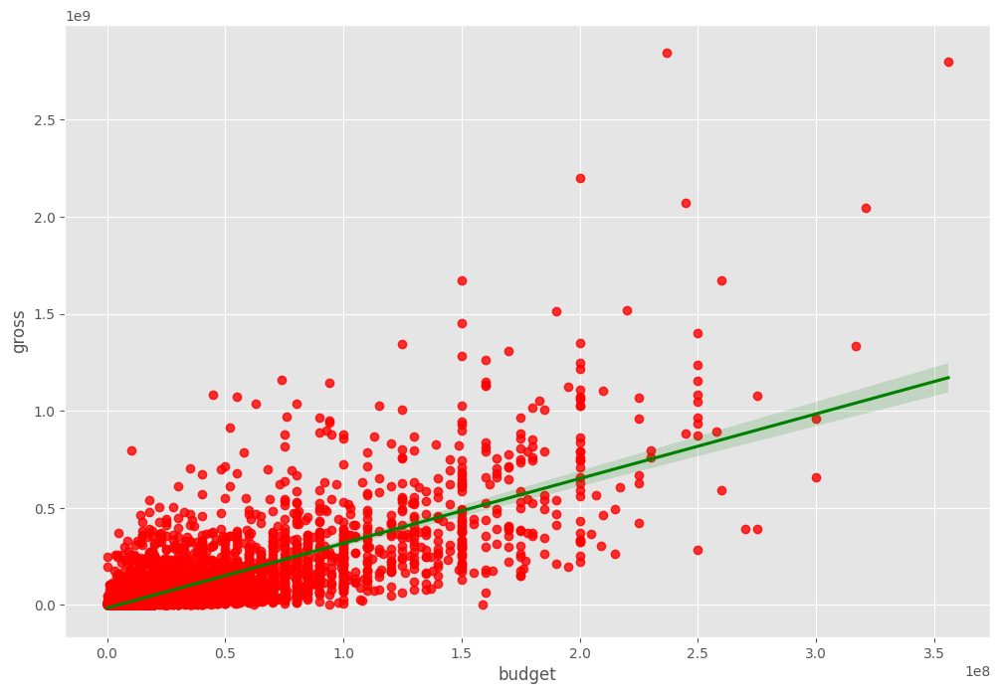

In [ ]:
#plotting Budget vs Gross using seaborn
sns.regplot(x='budget',y='gross',data=df,scatter_kws={"color":"red"},line_kws={"color":"green"})

In [ ]:
df3 = df.select_dtypes(include=np.number)
df3.corr()

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


In [ ]:
df3.corr(method='pearson')#pearson correlation

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


In [ ]:
df3.corr(method ='kendall')

,year,score,votes,budget,gross,runtime
year,1.000000,0.039389,0.296512,0.220833,0.239539,0.064824
score,0.039389,1.000000,0.350185,-0.006406,0.124943,0.292254
votes,0.296512,0.350185,1.000000,0.346274,0.553625,0.205344
budget,0.220833,-0.006406,0.346274,1.000000,0.512057,0.231278
gross,0.239539,0.124943,0.553625,0.512057,1.000000,0.176979
runtime,0.064824,0.292254,0.205344,0.231278,0.176979,1.000000


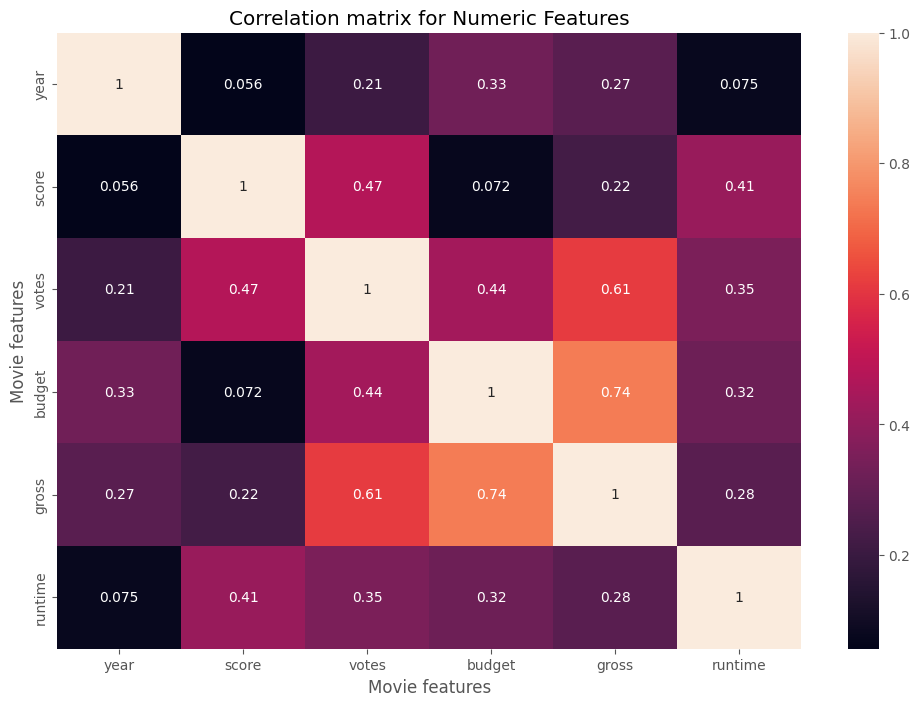

In [ ]:
correlation_matrix = df3.corr()
sns.heatmap(correlation_matrix, annot = True)
plt.title("Correlation matrix for Numeric Features")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()


In [ ]:
# Using factorize - this assigns a random numeric value for each unique categorical value

df2=df.apply(lambda x: x.factorize()[0]).corr(method='pearson')

In [ ]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


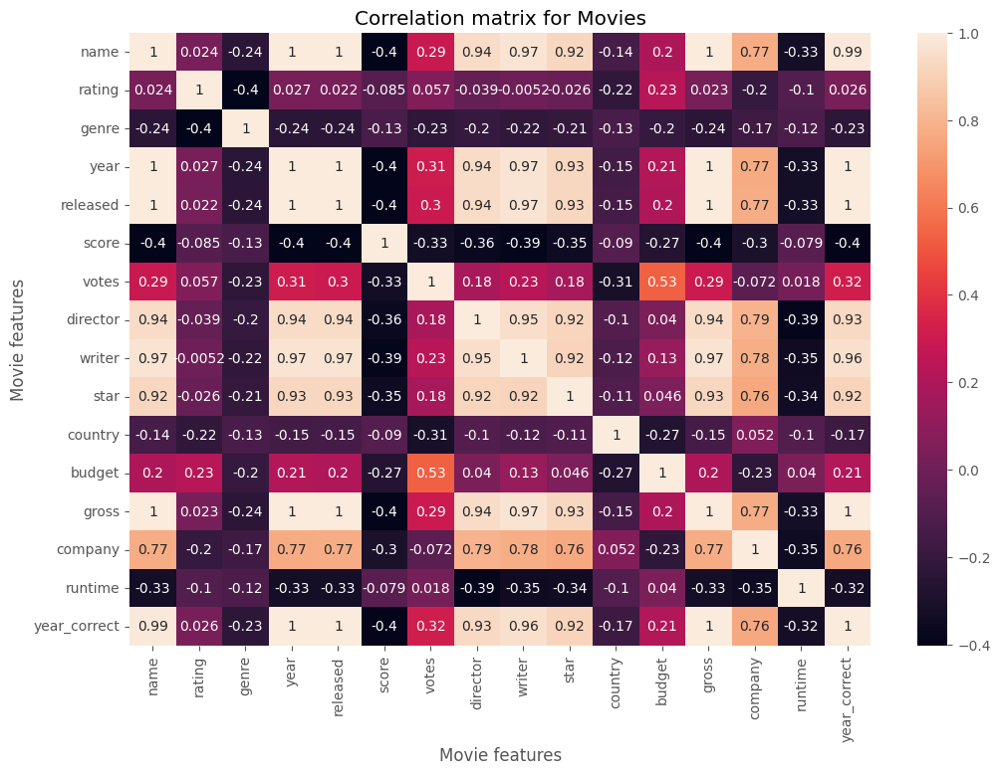

In [ ]:
correlation_matrix = df2.corr()

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [ ]:
cr_ma=df2.corr()#shows the correlation between different Values
cr_pairs=cr_ma.unstack()
cr_pairs

name          name            1.000000
              rating          0.024000
              genre          -0.241552
              year            0.999052
              released        0.999164
              score          -0.400709
              votes           0.290913
              director        0.940267
              writer          0.968800
              star            0.924261
              country        -0.143024
              budget          0.195169
              gross           0.999222
              company         0.774358
              runtime        -0.327029
              year_correct    0.993836
rating        name            0.024000
              rating          1.000000
              genre          -0.399228
              year            0.027403
              released        0.022073
              score          -0.085223
              votes           0.057091
              director       -0.039063
              writer         -0.005229
              star           -0.025808
              country        -0.219723
              budget          0.231523
              gross           0.022965
              company        -0.201942
              runtime        -0.103456
              year_correct    0.026074
genre         name           -0.241552
              rating         -0.399228
              genre           1.000000
              year           -0.244777
              released       -0.241456
              score          -0.131902
              votes          -0.230952
              director       -0.202192
              writer         -0.221823
              star           -0.205793
              country        -0.130490
              budget         -0.201015
              gross          -0.240596
              company        -0.171894
              runtime        -0.119617
              year_correct   -0.233552
year          name            0.999052
              rating          0.027403
              genre          -0.244777
              year            1.000000
              released        0.999928
              score          -0.402742
              votes           0.305368
              director        0.940821
              writer          0.969383
              star            0.925573
              country        -0.153354
              budget          0.211016
              gross           0.999883
              company         0.766317
              runtime        -0.326104
              year_correct    0.995092
released      name            0.999164
              rating          0.022073
              genre          -0.241456
              year            0.999928
              released        1.000000
              score          -0.402470
              votes           0.297781
              director        0.942445
              writer          0.969611
              star            0.926782
              country        -0.148088
              budget          0.203168
              gross           0.999981
              company         0.772267
              runtime        -0.328613
              year_correct    0.995172
score         name           -0.400709
              rating         -0.085223
              genre          -0.131902
              year           -0.402742
              released       -0.402470
              score           1.000000
              votes          -0.333851
              director       -0.359339
              writer         -0.390918
              star           -0.348047
              country        -0.090481
              budget         -0.267973
              gross          -0.399269
              company        -0.298762
              runtime        -0.079081
              year_correct   -0.395494
votes         name            0.290913
              rating          0.057091
              genre          -0.230952
              year            0.305368
              released        0.297781
              score          -0.333851
              votes   

In [ ]:
sorted_pairs=cr_pairs.sort_values()
sorted_pairs

year          score          -0.402742
score         year           -0.402742
released      score          -0.402470
score         released       -0.402470
              name           -0.400709
name          score          -0.400709
score         gross          -0.399269
gross         score          -0.399269
rating        genre          -0.399228
genre         rating         -0.399228
year_correct  score          -0.395494
score         year_correct   -0.395494
writer        score          -0.390918
score         writer         -0.390918
runtime       director       -0.390239
director      runtime        -0.390239
score         director       -0.359339
director      score          -0.359339
company       runtime        -0.349195
runtime       company        -0.349195
star          score          -0.348047
score         star           -0.348047
runtime       writer         -0.346859
writer        runtime        -0.346859
star          runtime        -0.340629
runtime       star           -0.340629
score         votes          -0.333851
votes         score          -0.333851
runtime       gross          -0.330171
gross         runtime        -0.330171
released      runtime        -0.328613
runtime       released       -0.328613
name          runtime        -0.327029
runtime       name           -0.327029
year          runtime        -0.326104
runtime       year           -0.326104
year_correct  runtime        -0.323991
runtime       year_correct   -0.323991
country       votes          -0.314274
votes         country        -0.314274
company       score          -0.298762
score         company        -0.298762
budget        country        -0.274425
country       budget         -0.274425
budget        score          -0.267973
score         budget         -0.267973
genre         year           -0.244777
year          genre          -0.244777
genre         name           -0.241552
name          genre          -0.241552
released      genre          -0.241456
genre         released       -0.241456
gross         genre          -0.240596
genre         gross          -0.240596
              year_correct   -0.233552
year_correct  genre          -0.233552
genre         votes          -0.230952
votes         genre          -0.230952
company       budget         -0.227594
budget        company        -0.227594
writer        genre          -0.221823
genre         writer         -0.221823
rating        country        -0.219723
country       rating         -0.219723
star          genre          -0.205793
genre         star           -0.205793
              director       -0.202192
director      genre          -0.202192
rating        company        -0.201942
company       rating         -0.201942
genre         budget         -0.201015
budget        genre          -0.201015
country       year_correct   -0.174818
year_correct  country        -0.174818
company       genre          -0.171894
genre         company        -0.171894
country       year           -0.153354
year          country        -0.153354
country       gross          -0.148716
gross         country        -0.148716
released      country        -0.148088
country       released       -0.148088
              name           -0.143024
name          country        -0.143024
genre         score          -0.131902
score         genre          -0.131902
genre         country        -0.130490
country       genre          -0.130490
runtime       genre          -0.119617
genre         runtime        -0.119617
writer        country        -0.119186
country       writer         -0.119186
star          country        -0.109565
country       star           -0.109565
runtime       rating         -0.103456
rating        runtime        -0.103456
runtime       country        -0.102517
country       runtime        -0.102517
director      country        -0.100304
country       director       -0.100304
              score          -0.090481
score         country        -0.090481
              rating  

In [ ]:
high_corr=sorted_pairs[(sorted_pairs)>0.5]
high_corr

votes         budget          0.532033
budget        votes           0.532033
year_correct  company         0.755219
company       year_correct    0.755219
star          company         0.764292
company       star            0.764292
year          company         0.766317
company       year            0.766317
              released        0.772267
released      company         0.772267
company       gross           0.773118
gross         company         0.773118
company       name            0.774358
name          company         0.774358
writer        company         0.775489
company       writer          0.775489
              director        0.794457
director      company         0.794457
star          writer          0.915030
writer        star            0.915030
year_correct  star            0.915511
star          year_correct    0.915511
director      star            0.920551
star          director        0.920551
name          star            0.924261
star          name            0.924261
              year            0.925573
year          star            0.925573
star          released        0.926782
released      star            0.926782
star          gross           0.927350
gross         star            0.927350
director      year_correct    0.928777
year_correct  director        0.928777
name          director        0.940267
director      name            0.940267
year          director        0.940821
director      year            0.940821
released      director        0.942445
director      released        0.942445
              gross           0.943037
gross         director        0.943037
writer        director        0.953180
director      writer          0.953180
writer        year_correct    0.958780
year_correct  writer          0.958780
writer        name            0.968800
name          writer          0.968800
writer        year            0.969383
year          writer          0.969383
writer        released        0.969611
released      writer          0.969611
gross         writer          0.970001
writer        gross           0.970001
year_correct  name            0.993836
name          year_correct    0.993836
year_correct  year            0.995092
year          year_correct    0.995092
year_correct  gross           0.995157
gross         year_correct    0.995157
released      year_correct    0.995172
year_correct  released        0.995172
year          name            0.999052
name          year            0.999052
released      name            0.999164
name          released        0.999164
gross         name            0.999222
name          gross           0.999222
gross         year            0.999883
year          gross           0.999883
              released        0.999928
released      year            0.999928
              gross           0.999981
gross         released        0.999981
name          name            1.000000
company       company         1.000000
gross         gross           1.000000
budget        budget          1.000000
country       country         1.000000
star          star            1.000000
writer        writer          1.000000
director      director        1.000000
votes         votes           1.000000
score         score           1.000000
released      released        1.000000
year          year            1.000000
genre         genre           1.000000
rating        rating          1.000000
runtime       runtime         1.000000
year_correct  year_correct    1.000000
dtype: float64